<h1>Patient Survival Prediction</h1>
<hr>
<h2>Project 4</h2>
<p>This project predicts the survival of pacients in a UCI.</p>
<hr>

In [1]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

from utilerias import missing_values_table

%matplotlib inline

In [2]:
#read dataset
df_patients = pd.read_csv('../datasets/Dataset.csv')

<hr>
<h2>EDA</h2>
<hr>

In [3]:
#eliminate any kind of format or upper letters on the feature's names
df_patients.columns=df_patients.columns.str.lower().str.replace(' ', '_')

In [22]:
df_patients

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,91592,78108,30,0,75.0,23.060250,0,Caucasian,M,177.8,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,66119,13486,121,0,56.0,47.179671,0,Caucasian,F,183.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,8981,58179,195,0,48.0,27.236914,0,Caucasian,M,170.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,33776,120598,66,0,NaN,23.297481,0,Caucasian,F,154.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [15]:
df_patients.shape

(91713, 186)

In [27]:
df_patients.describe()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,...,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,91713.000000,91713.000000,91713.000000,91713.000000,87485.000000,88284.000000,91713.000000,90379.000000,91713.000000,91713.000000,...,83766.000000,83766.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000
mean,65606.079280,65537.131464,105.669262,0.086302,62.309516,29.185818,0.183736,169.641588,508.357692,0.835766,...,0.086787,0.043955,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638
std,37795.088538,37811.252183,62.854406,0.280811,16.775119,8.275142,0.387271,10.795378,228.989661,2.487756,...,0.247569,0.217341,0.029265,0.124284,0.417711,0.113229,0.159628,0.083763,0.064148,0.142169
min,1.000000,1.000000,2.000000,0.000000,16.000000,14.844926,0.000000,137.200000,82.000000,-24.947222,...,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32852.000000,32830.000000,47.000000,0.000000,52.000000,23.641975,0.000000,162.500000,369.000000,0.035417,...,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,65665.000000,65413.000000,109.000000,0.000000,65.000000,27.654655,0.000000,170.100000,504.000000,0.138889,...,0.050000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,98342.000000,98298.000000,161.000000,0.000000,75.000000,32.930206,0.000000,177.800000,679.000000,0.409028,...,0.130000,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,131051.000000,131051.000000,204.000000,1.000000,89.000000,67.814990,1.000000,195.590000,927.000000,159.090972,...,0.990000,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [4]:
df_patients.describe(include=['O']).T

,count,unique,top,freq
ethnicity,90318,6,Caucasian,70684
gender,91688,2,M,49469
hospital_admit_source,70304,15,Emergency Department,36962
icu_admit_source,91601,5,Accident & Emergency,54060
icu_stay_type,91713,3,admit,86183
icu_type,91713,8,Med-Surg ICU,50586
apache_3j_bodysystem,90051,11,Cardiovascular,29999
apache_2_bodysystem,90051,10,Cardiovascular,38816


In [18]:
df_patients.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Data columns (total 186 columns):
 #    Column                         Non-Null Count  Dtype  
---   ------                         --------------  -----  
 0    encounter_id                   91713 non-null  int64  
 1    patient_id                     91713 non-null  int64  
 2    hospital_id                    91713 non-null  int64  
 3    hospital_death                 91713 non-null  int64  
 4    age                            87485 non-null  float64
 5    bmi                            88284 non-null  float64
 6    elective_surgery               91713 non-null  int64  
 7    ethnicity                      90318 non-null  object 
 8    gender                         91688 non-null  object 
 9    height                         90379 non-null  float64
 10   hospital_admit_source          70304 non-null  object 
 11   icu_admit_source               91601 non-null  object 
 12   icu_id                        

/tmp/ipykernel_40678/1212657085.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [23]:
#show null values
#remember de recomendation about to drop a column with more than 80% of nulls

missing_values_table(df_patients).style.background_gradient(cmap='Blues')
#table.style.background_gradient(cmap='Blues')

Sumary :
Columns     :186
Null values :175


,Missing Values,% of Total Values
h1_bilirubin_max,84619,92.300000
h1_bilirubin_min,84619,92.300000
h1_lactate_min,84369,92.000000
h1_lactate_max,84369,92.000000
h1_albumin_max,83824,91.400000
h1_albumin_min,83824,91.400000
h1_pao2fio2ratio_min,80195,87.400000
h1_pao2fio2ratio_max,80195,87.400000
h1_arterial_ph_min,76424,83.300000
h1_arterial_ph_max,76424,83.300000


Remember to delete the selected features on the preprossesing stage

<hr>
<h2>Univariable Analysis</h2>
<hr>

In [5]:
#lets delete some features
#1) those that seems not related
lstFeaturesToDrop1 = ['encounter_id', 'hospital_admit_source', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'patient_id', 'hospital_id', 'readmission_status']
#2) those with 50% of missing values or more.
lstFeaturesToDrop2 = ['h1_bilirubin_max'
,'h1_bilirubin_min'
,'h1_lactate_min'
,'h1_lactate_max'
,'h1_albumin_max'
,'h1_albumin_min'
,'h1_pao2fio2ratio_min'
,'h1_pao2fio2ratio_max'
,'h1_arterial_ph_min'
,'h1_arterial_ph_max'
,'h1_hco3_min'
,'h1_hco3_max'
,'h1_arterial_pco2_min'
,'h1_arterial_pco2_max'
,'h1_wbc_max'
,'h1_wbc_min'
,'h1_arterial_po2_max'
,'h1_arterial_po2_min'
,'h1_calcium_min'
,'h1_calcium_max'
,'h1_platelets_max'
,'h1_platelets_min'
,'h1_bun_min'
,'h1_bun_max'
,'h1_creatinine_min'
,'h1_creatinine_max'
,'h1_diasbp_invasive_max'
,'h1_diasbp_invasive_min'
,'h1_sysbp_invasive_max'
,'h1_sysbp_invasive_min'
,'h1_mbp_invasive_min'
,'h1_mbp_invasive_max'
,'h1_hematocrit_min'
,'h1_hematocrit_max'
,'h1_hemaglobin_max'
,'h1_hemaglobin_min'
,'h1_sodium_max'
,'h1_sodium_min'
,'h1_potassium_min'
,'h1_potassium_max'
,'ph_apache'
,'pao2_apache'
,'paco2_for_ph_apache'
,'paco2_apache'
,'fio2_apache'
,'d1_lactate_max'
,'d1_lactate_min'
,'d1_diasbp_invasive_min'
,'d1_diasbp_invasive_max'
,'d1_sysbp_invasive_max'
,'d1_sysbp_invasive_min'
,'d1_mbp_invasive_min'
,'d1_mbp_invasive_max'
,'d1_pao2fio2ratio_min'
,'d1_pao2fio2ratio_max'
,'d1_arterial_ph_min'
,'d1_arterial_ph_max'
,'d1_arterial_pco2_max'
,'d1_arterial_pco2_min'
,'d1_arterial_po2_min'
,'d1_arterial_po2_max'
,'bilirubin_apache'
,'h1_inr_max'
,'d1_inr_min'
,'h1_inr_min'
,'d1_inr_max'
,'albumin_apache'
,'d1_bilirubin_min'
,'d1_bilirubin_max'
,'h1_glucose_min'
,'h1_glucose_max'
,'d1_albumin_min'
,'d1_albumin_max'
,'urineoutput_apache']

In [4]:
lstGraph =['glucose_apache'
,'d1_potassium_max'
,'h1_mbp_noninvasive_max'
,'apache_4a_hospital_death_prob'
,'apache_4a_icu_death_prob'
,'d1_glucose_max'
,'h1_mbp_max'
,'h1_resprate_min'
,'h1_resprate_max'
,'age'
,'h1_spo2_min'
,'h1_spo2_max'
,'bmi'
,'h1_heartrate_max'
,'weight'
,'height'
,'resprate_apache'
,'heart_rate_apache'
,'intubated_apache'
,'aids'
,'hepatic_failure'
,'immunosuppression'
,'solid_tumor_with_metastasis'
,'leukemia'
,'cirrhosis'
,'diabetes_mellitus'
,'d1_spo2_max'
,'gender'
]

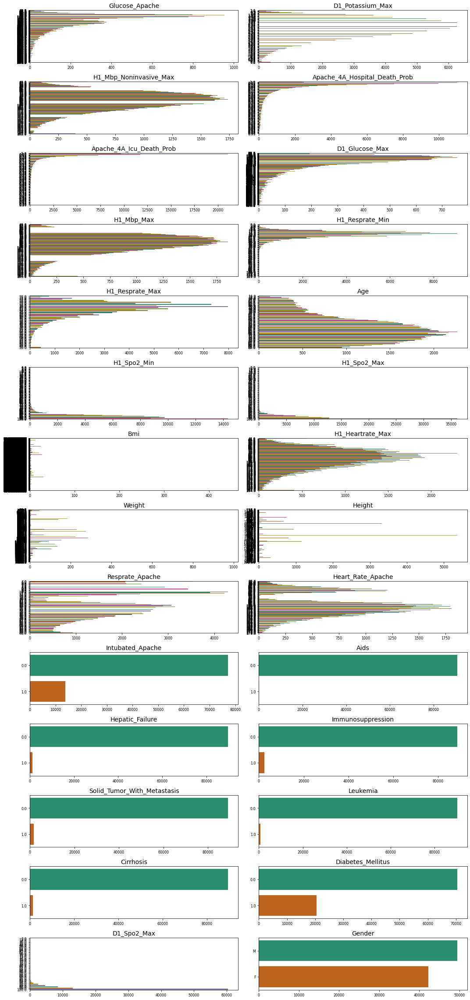

In [6]:
#showing features from every dataset in order to compare them
plt.figure(figsize=(15,140))
plotnumber = 1

for col in df_patients[lstGraph]:
    if plotnumber <= df_patients.shape[1]:
        ax1 = plt.subplot(62,2,plotnumber)
        sns.countplot(data=df_patients, y=col, palette='Dark2')
        plt.xticks(fontsize=8)
        plt.yticks(fontsize=8)
        plt.title(col.title(), fontsize=14)
        plt.xlabel('')
        plt.ylabel('')
        
    plotnumber +=1
plt.tight_layout()

<hr>
<h3>Multivariable</h3>
<hr>
<p>traditionally patients intubated, overheight, serious decease suffering, and males have less chances to survive in a UCI, lets compare them agaist target variable</p>

In [9]:
#age vs hospital_death
fig = px.histogram(df_patients[['age','hospital_death','gender']].dropna(), x="age", y="hospital_death", color='gender')
fig.show()

In [10]:
#BMI agains hospital_death
fig = px.histogram(df_patients[['bmi','hospital_death','gender']].dropna(), x="bmi", y="hospital_death", color='gender')
fig.show()

In [11]:
fig = px.histogram(df_patients[['weight','hospital_death','gender']].dropna(), x="weight", y="hospital_death", color='gender')
fig.show()

In [12]:
fig = px.histogram(df_patients[['intubated_apache','hospital_death','gender']].dropna(), x="intubated_apache", y="hospital_death", color='gender')
fig.show()

In [14]:
#'icu_type'
fig = px.histogram(df_patients[['icu_type','hospital_death','gender']].dropna(), x="icu_type", y="hospital_death", color='gender')
fig.show()


<hr>
<h3>Preliminary Conclusions:</h3>
<hr>
<lu>
    <li></li>
    <li></li>
    <li></li>
    <li></li>
</lu>

<p>Distribution for numerical features</p>

In [ ]:
unpivot = pd.melt(df_patients, df_patients.describe().columns[0], df_patients.describe().columns[1:])

g = sns.FacetGrid(unpivot, col="variable", col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, "value")

plt.show()

<hr>
save dataset for preprocessing stage
<hr>

In [ ]:
#save it, because the feature's names were standarized
df_patients.to_csv('../datasets/dataset_eda.csv')